<span style="color: #FF4FA7; font-family: Times New Roman; font-size: 2em;">DIFFUSION INTERVENTIONS on Layers ᕙ(‾̀◡‾́)ᕗ</span>


In [1]:
from main import load, run
from interventions.ablate import AblationIntervention
from interventions.encoder import EncoderIntervention
from util import encode_prompt
import matplotlib.pyplot as plt
import numpy as np

/share/u/imgr/miniconda3/envs/nnsight/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
model = load()
model._model.pipeline.safety_checker = None

Keyword arguments {'trust_remote_code': True} are not expected by StableDiffusionPipeline and will be ignored.
Loading pipeline components...: 100%|██████████| 7/7 [00:00<00:00, 11.66it/s]


100%|██████████| 50/50 [00:09<00:00,  5.27it/s]


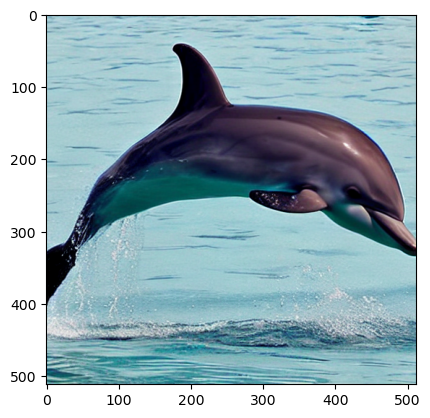

In [3]:
image = run(model, prompt="dolphin baby", seed=400)
plt.imshow(image)

In [4]:
#LAYER PATHS IN THE RIGHT ORDER

my_self_layers =[
    '.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn1', #1
    '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn1', #2
    '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn1', #3
    '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn1', #4
    '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn1', #5
    '.unet.down_blocks.2.attentions.1.transformer_blocks.0.attn1', #6
    '.unet.mid_block.attentions.0.transformer_blocks.0.attn1', #7
    '.unet.up_blocks.1.attentions.0.transformer_blocks.0.attn1', #8
    '.unet.up_blocks.1.attentions.1.transformer_blocks.0.attn1', #9
    '.unet.up_blocks.1.attentions.2.transformer_blocks.0.attn1', #10
    '.unet.up_blocks.2.attentions.0.transformer_blocks.0.attn1', #11
    '.unet.up_blocks.2.attentions.1.transformer_blocks.0.attn1', #12
    '.unet.up_blocks.2.attentions.2.transformer_blocks.0.attn1', #13
    '.unet.up_blocks.3.attentions.0.transformer_blocks.0.attn1', #14
    '.unet.up_blocks.3.attentions.1.transformer_blocks.0.attn1', #15
    '.unet.up_blocks.3.attentions.2.transformer_blocks.0.attn1' #16
]

my_cross_layers =[
    '.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2',
    '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2',
    '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2',
    '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2',
    '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2',
    '.unet.down_blocks.2.attentions.1.transformer_blocks.0.attn2',
    '.unet.mid_block.attentions.0.transformer_blocks.0.attn2',
    '.unet.up_blocks.1.attentions.0.transformer_blocks.0.attn2',
    '.unet.up_blocks.1.attentions.1.transformer_blocks.0.attn2',
    '.unet.up_blocks.1.attentions.2.transformer_blocks.0.attn2',
    '.unet.up_blocks.2.attentions.0.transformer_blocks.0.attn2',
    '.unet.up_blocks.2.attentions.1.transformer_blocks.0.attn2',
    '.unet.up_blocks.2.attentions.2.transformer_blocks.0.attn2',
    '.unet.up_blocks.3.attentions.0.transformer_blocks.0.attn2',
    '.unet.up_blocks.3.attentions.1.transformer_blocks.0.attn2',
    '.unet.up_blocks.3.attentions.2.transformer_blocks.0.attn2'
]

In [5]:
#BLOCKS:
down_1 = [0,1]
down_2 = [2,3]
down_3 = [4,5]
mid = [6]
up_1 = [7,8,9]
up_2 = [10,11,12]
up_3 = [13,14,15]

PLOT IMAGE

100%|██████████| 50/50 [00:05<00:00,  8.63it/s]


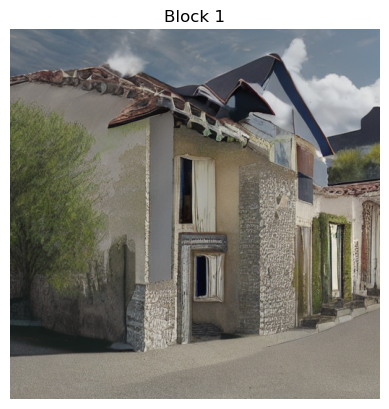

In [17]:
envoys = model._envoy.modules(lambda envoy : envoy._module_path.endswith('attn2')) #and envoy._module_path not in [my_cross_layers[idx] for idx in [np.concatenate[down_3, mid]]])

#intervention1 = AblationIntervention(envoys)

blank_embeds = encode_prompt("", model)
intervention2 = EncoderIntervention(blank_embeds, envoys)
    
image = run(model, prompt="blue elephant", seed=440, interventions=[intervention2])

plt.title("Block 1")
plt.axis('off')
plt.imshow(image)

100%|██████████| 50/50 [00:05<00:00,  8.55it/s]


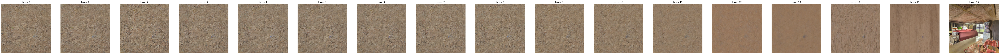

In [97]:
plt.figure(figsize=(100,20))
for m in range(17):

    envoys = model._envoy.modules(lamdba envoy : envoy._module_path.endswith('attn1'))

    #envoys1 = model._envoy.modules(lambda envoy : envoy._module_path.endswith('attn1') and envoy._module_path not in my_self_layers[:m])
    #envoys2 = model._envoy.modules(lambda envoy : envoy._module_path.endswith('attn2'))

    intervention1 = AblationIntervention(envoys1)
    
    blank_embeds = encode_prompt("", model)
    intervention2 = EncoderIntervention(blank_embeds, envoys2)
    
    image = run(model, prompt="", seed=40, interventions=[intervention1, intervention2])
    #image.save('testblank.png')
    plt.subplot(1, 17, m+1)
    plt.title(f"Layer {m}")
    plt.axis('off')
    plt.imshow(image)
plt.show()

<span style="color: #FF4FA7; font-family: Times New Roman; font-size: 2em;">Layer Rows</span>

['.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2']


100%|██████████| 50/50 [00:05<00:00,  8.59it/s]


['.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2']


100%|██████████| 50/50 [00:05<00:00,  8.59it/s]


['.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2']


100%|██████████| 50/50 [00:05<00:00,  8.57it/s]


['.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2']


100%|██████████| 50/50 [00:05<00:00,  8.54it/s]


['.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2']


100%|██████████| 50/50 [00:05<00:00,  8.53it/s]


['.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2']


100%|██████████| 50/50 [00:05<00:00,  8.54it/s]


['.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2']


100%|██████████| 50/50 [00:05<00:00,  8.51it/s]


['.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2']


100%|██████████| 50/50 [00:05<00:00,  8.51it/s]


['.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2']


100%|██████████| 50/50 [00:05<00:00,  8.49it/s]


['.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2']


100%|██████████| 50/50 [00:05<00:00,  8.45it/s]


['.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2']


100%|██████████| 50/50 [00:05<00:00,  8.43it/s]


['.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2']


100%|██████████| 50/50 [00:05<00:00,  8.44it/s]


['.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2']


100%|██████████| 50/50 [00:05<00:00,  8.44it/s]


['.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2']


100%|██████████| 50/50 [00:05<00:00,  8.42it/s]


['.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2']


100%|██████████| 50/50 [00:05<00:00,  8.41it/s]


['.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2']


100%|██████████| 50/50 [00:05<00:00,  8.41it/s]


['.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2', '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2', '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2']


100%|██████████| 50/50 [00:05<00:00,  8.41it/s]


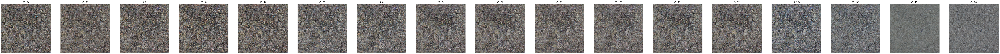

In [16]:
plt.figure(figsize=(100,100))
i=0
m=5
for n in range(17):
    print(my_cross_layers[:m])
    i += 1
    envoys = model._envoy.modules(lambda envoy : (envoy._module_path.endswith('attn1') and envoy._module_path not in my_self_layers[:m]) or (envoy._module_path.endswith('attn2') and envoy._module_path not in my_cross_layers[:n]))

    intervention1 = AblationIntervention(envoys)
    
    blank_embeds = encode_prompt("", model)
    intervention2 = EncoderIntervention(blank_embeds, envoys)
    
    image = run(model, prompt="blue elephant", seed=40, interventions=[intervention1])
    #image.save('testblank.png')
    plt.subplot(1, 17, i)
    plt.title(f"{m,n}")
    plt.axis('off')
    plt.imshow(image)
plt.show()
#plt.savefig("master.png")

<span style="color: #FF4FA7; font-family: Times New Roman; font-size: 2em;">U-NET Plot</span>

In [66]:
import matplotlib.pyplot as plt

def plot_unet(self_n, cross_n, ax=None):
    dim1 = 8
    dim2 = 16
    dim3 = 32
    dim4 = 64

    # Define the layers (same as before)

    # Create a figure and axis if not provided
    if ax is None:
        fig, ax = plt.subplots()
    # Define the layers
    layers = {
        'Layer 1': (0, dim1+dim2+dim3, dim4, dim4),  # (bottom-left corner coordinates, width, height)
        'Layer 2': (dim4, dim1+dim2+dim3, dim4, dim4),
        'Layer 3': (dim4*2, dim1+dim2, dim3, dim3),
        'Layer 4': (dim4*2+dim3, dim1+dim2, dim3, dim3),
        'Layer 5': (dim4*2+dim3*2, dim1, dim2, dim2),
        'Layer 6': (dim4*2+dim3*2+dim2, dim1, dim2, dim2),

        'Layer 7': (dim4*2+dim3*2+dim2*2, 0, dim1, dim1),
                    
        'Layer 8': (dim4*2+dim3*2+dim2*2+dim1, dim1, dim2, dim2),
        'Layer 9': (dim4*2+dim3*2+dim2*2+dim1+dim2, dim1, dim2, dim2),
        'Layer 10': (dim4*2+dim3*2+dim2*2+dim1+dim2*2, dim1, dim2, dim2),

        'Layer 11': (dim4*2+dim3*2+dim2*2+dim1+dim2*3, dim1+dim2, dim3, dim3),
        'Layer 12': (dim4*2+dim3*2+dim2*2+dim1+dim2*3+dim3, dim1+dim2, dim3, dim3),
        'Layer 13': (dim4*2+dim3*2+dim2*2+dim1+dim2*3+dim3*2, dim1+dim2, dim3, dim3),

        'Layer 14': (dim4*2+dim3*2+dim2*2+dim1+dim2*3+dim3*3, dim1+dim2+dim3, dim4, dim4),
        'Layer 15': (dim4*2+dim3*2+dim2*2+dim1+dim2*3+dim3*3+dim4, dim1+dim2+dim3, dim4, dim4),
        'Layer 16': (dim4*2+dim3*2+dim2*2+dim1+dim2*3+dim3*3+dim4*2, dim1+dim2+dim3, dim4, dim4)
    }

    # self
    for index, (label, (pos_x, pos_y, width, height)) in enumerate(layers.items()):
        if self_n[index] == 1:
            color = (0.92, 1.0, 0.0, .6)
        else:
            color = (0, 0, 0, 0)
        ax.add_patch(plt.Rectangle((pos_x, pos_y), width, height, edgecolor='black', facecolor=color, linewidth=.5))

    # cross
    for index, (label, (pos_x, pos_y, width, height)) in enumerate(layers.items()):
        if cross_n[index] == 1:
            color = (0.22, 1.0, 1.0, .6)
        else:
            color = (0, 0, 0, 0)
        ax.add_patch(plt.Rectangle((pos_x+4, pos_y-4), width, height, edgecolor='black', facecolor=color, linewidth=.5))

    # Set limits and aspect ratio
    ax.set_xlim(-5, dim1+dim2*5+dim3*5+dim4*5+1+4)
    ax.set_ylim(-5, dim1+dim2+dim3+dim4+1)
    ax.set_aspect('equal')
    ax.axis("off")

    plt.show()
    
    return fig, ax  # Always return the axis object

In [80]:
selfis = [0,0,1,1,1,1,0,1,0,0,0,0,0,0,0,0]
crossis = [1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0]

fig, ax = plot_unet(selfis, crossis)
plt.show()

NameError: name 'plot_unet' is not defined